In [1]:
# importing packages and modules
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.optimize import minimize
from utils import *
from plotting_utils import *
from analysis_utils import *
import dynamic_glmhmm
from scipy.stats import multivariate_normal, norm
# import jax

sns.set_context("talk")

In [2]:
# # setting hyperparameters
# S = 20 # sessions
# T = 1000 # trials per session
# N = T * S # total data points
# C = 2 # classes
# K = 2 # states
# D = 2 # features (sensory & bias)
# # true intial latent state distribution
# truepi = np.ones((K))/K

# # True Weights and Session Start Indices
# ourW = np.zeros((S,K,D))
# ourW[:,0,1] = np.linspace(0,2,S) # state 1 sensory (increasing)
# ourW[:,0,0] = np.linspace(-1,0,S) # state 1 bias (decreasing)
# ourW[:,1,1] = 0 # state 2 sensory (flat 0)
# ourW[:,1,0] = 1 # state 2 bias (flat 1)
# trueW = np.zeros((N,K,D,C))
# # change weight format to have session*trials points
# sessInd = []
# for sess in range(0,S):
#     sessInd.append(sess*T)
#     for t in range(0,T):
#         trueW[sess*T+t,:,:,1] = ourW[sess,:,:]
# sessInd.append(N)

# fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
# plotting_weights(w=trueW, sessInd=sessInd, axes=axes, trueW=None, title='True weights W', save_fig=False)
# axes.set_ylim(-2.1,2.1)

# # True Transition Matrix
# trueP = np.zeros((2,2))
# trueP[0,0]=0.97
# trueP[0,1]=0.03
# trueP[1,0]=.05
# trueP[1,1]=.95

# dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,K,D,C)
# # x, y, _ = dGLM_HMM.simulate_data(trueW, trueP, truepi, sessInd, save=True, title=f'/N={N}_{K}_state_constant-drift_')
# x = np.load(f'../data_M1/N={N}_{K}_state_constant-drift_x.npy')
# y = np.load(f'../data_M1/N={N}_{K}_state_constant-drift_y.npy')

# splitFolds = 5
# sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
# allP = np.load(f'../data_M1/N={N}_{K}_P_CV_sigma1D_simulated_data.npy')
# allW = np.load(f'../data_M1/N={N}_{K}_W_CV_sigma1D_simulated_data.npy')
# testLl = np.load(f'../data_M1/N={N}_{K}_testLl_CV_sigma1D_simulated_data.npy')
# testAccuracy = np.load(f'../data_M1/N={N}_{K}_testAccuracy_CV_sigma1D_simulated_data.npy')

# bestIndSigma = 9
# dglmhmmW = np.mean(allW, axis=0) # averaging across folds and taking best sigma
# print(dglmhmmW.shape)
# globalP = np.mean(allP, axis=0)
# sortedStateInd = get_states_order(dglmhmmW[0], sessInd, stimCol=[1])
# fig, axes = plt.subplots()
# plot_transition_matrix(globalP[bestIndSigma], f'averaged P for sigma={np.round(sigmaList[bestIndSigma],2)}', sortedStateInd=sortedStateInd)
# fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
# plotting_weights(dglmhmmW[bestIndSigma], sessInd, axes=axes,  trueW=trueW, title=f'averaged weights for sigma={np.round(sigmaList[bestIndSigma],2)}', save_fig=False, sortedStateInd=sortedStateInd)

In [3]:
# setting hyperparameters
S = 20 # sessions
T = 1000 # trials per session
N = T * S # total data points
C = 2 # classes
K = 2 # states
D = 2 # features (sensory & bias)
truepi = np.ones((K))/K

Session indicies
[0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000]
(20000, 2, 2, 2)


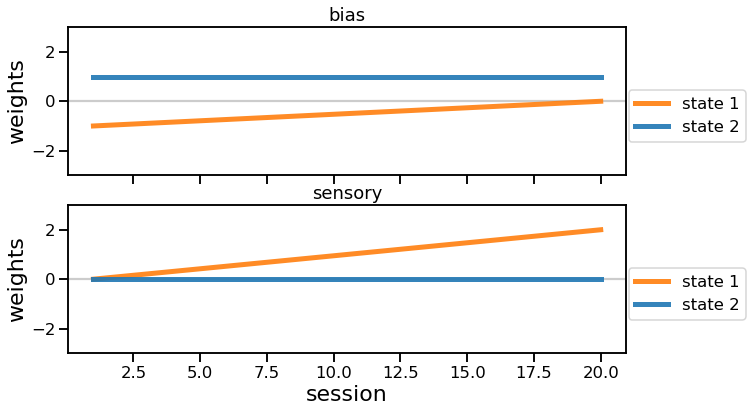

In [4]:
# True Weights and Session Start Indices
ourW = np.zeros((S,K,D))
ourW[:,0,1] = np.linspace(0,2,S) # state 1 sensory (increasing)
ourW[:,0,0] = np.linspace(-1,0,S) # state 1 bias (decreasing)
ourW[:,1,1] = 0 # state 2 sensory (flat 0)
ourW[:,1,0] = 1 # state 2 bias (flat 1)
trueW = np.zeros((N,K,D,C))
# change weight format to have session*trials points
sessInd = []
for sess in range(0,S):
    sessInd.append(sess*T)
    for t in range(0,T):
        trueW[sess*T+t,:,:,1] = ourW[sess,:,:]
sessInd.append(N)
print("Session indicies")
print(sessInd)

print(trueW.shape)
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(trueW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=None, labels=['bias', 'sensory'])

# If true transtion matrix is static

In [5]:
# True Transition Matrix
ourP = np.zeros((2,2))
ourP[0,0]=0.97
ourP[0,1]=0.03
ourP[1,0]=.05
ourP[1,1]=.95
print("True Transition Matrix P")
print(ourP)

trueP = np.zeros((N,K,K))
for sess in range(0,S):
    for t in range(0,T):
        trueP[sess*T+t] = ourP

True Transition Matrix P
[[0.97 0.03]
 [0.05 0.95]]


In [6]:
dGLMHMM = dynamic_glmhmm.dynamic_GLMHMM(N,K,D,C)
trainX, trainY , z = dGLMHMM.simulate_data(trueW, trueP, truepi, sessInd)

0
[[0.94551514 0.05448486]
 [0.03019872 0.96980128]]


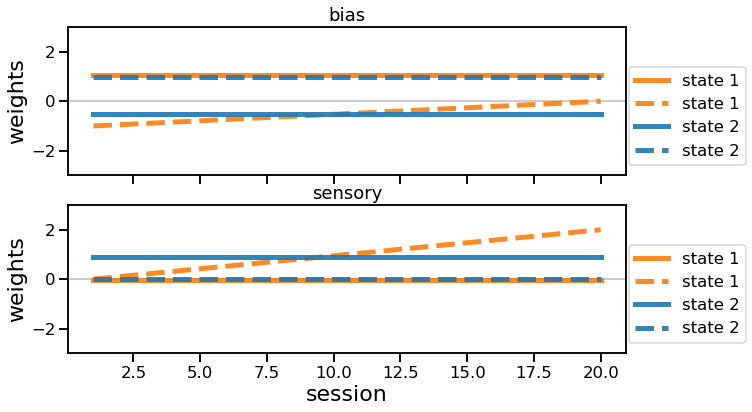

In [16]:
model_type = 'standard'
initP, initpi, initW = dGLMHMM.generate_param(sessInd=sessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)], model_type=model_type) 
present = np.ones((N))
irrelevantSigma = np.ones((K,D))
standardP, standardpi, standardW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=initP, initpi=initpi, initW=initW, sigma=irrelevantSigma, sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=[10,1], model_type=model_type) # fit the model
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
reorder = [1,0]
plotting_weights_per_feature(standardW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
print(standardP[0])

[[0.96980128 0.03019872]
 [0.05448486 0.94551514]]


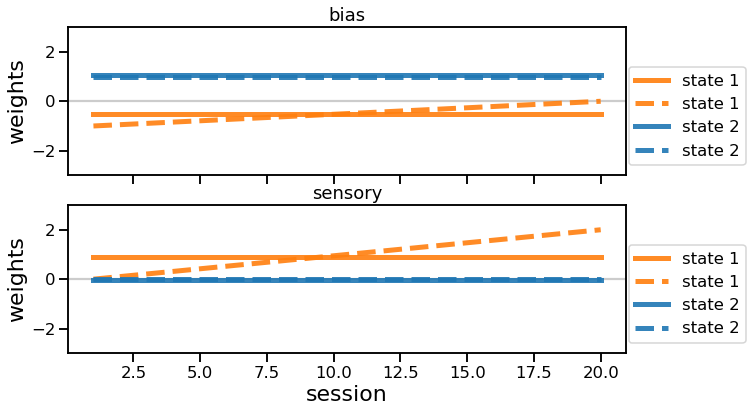

In [19]:
standardW = standardW[:,reorder,:,:]
standardP = standardP[:,reorder,:][:,:,reorder]
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(standardW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
print(standardP[0])

0
(20000, 2, 2, 2)
[[[0.97026746 0.02973254]
  [0.05456965 0.94543035]]

 [[0.97026746 0.02973254]
  [0.05456965 0.94543035]]

 [[0.97026746 0.02973254]
  [0.05456965 0.94543035]]

 ...

 [[0.97026746 0.02973254]
  [0.05456965 0.94543035]]

 [[0.97026746 0.02973254]
  [0.05456965 0.94543035]]

 [[0.97026746 0.02973254]
  [0.05456965 0.94543035]]]


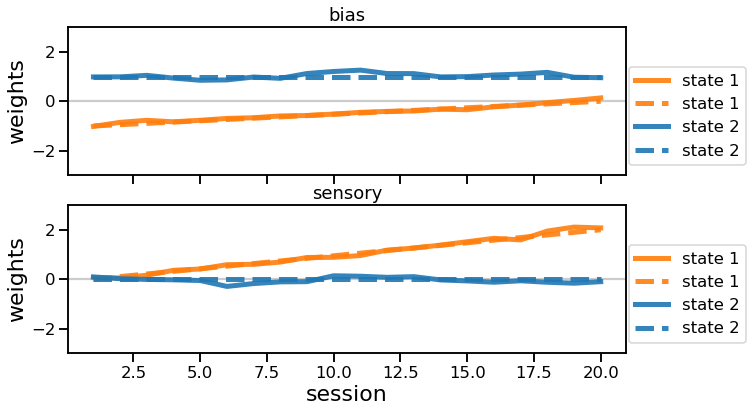

In [20]:
model_type = 'partial'
present = np.ones((N))
sigma = np.ones((K,D)) * 0.2
partialP, partialpi, partialW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=standardP, initpi=standardpi, initW=standardW, sigma=sigma, sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=[10,1], model_type=model_type) # fit the model
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(partialW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
print(partialW.shape)
print(partialP[0])

0
[[0.9678375  0.0321625 ]
 [0.05462895 0.94537105]]


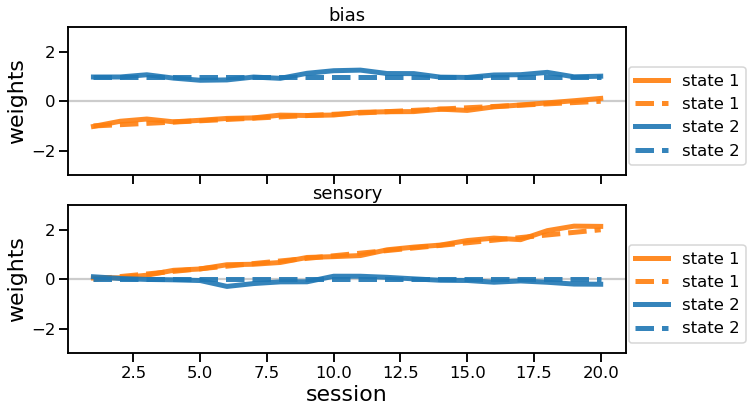

In [21]:
model_type = 'dynamic'
present = np.ones((N))
sigma = np.ones((K,D)) * 0.2
dynamicP, dynamicpi, dynamicW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=partialP, initpi=partialpi, initW=partialW, sigma=sigma, sessInd=sessInd, maxIter=250, tol=1e-4, A=partialP[0], priorDirP=None, model_type=model_type) # fit the model
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(dynamicW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
print(dynamicP[0])

# If true transtion matrix is time-varying

Global Transition Matrix P
[[0.97 0.03]
 [0.05 0.95]]


(0.0, 1.0)

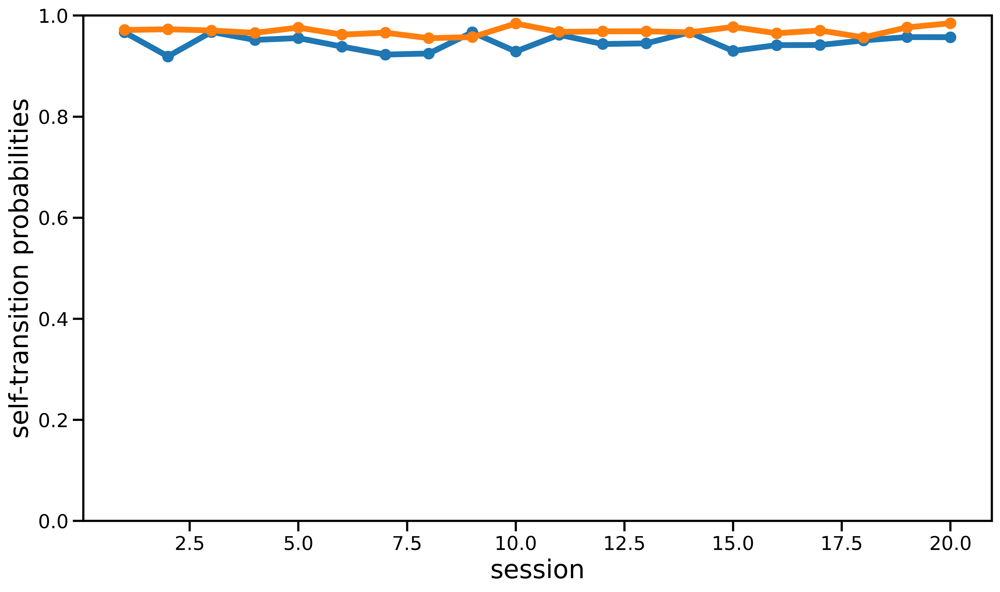

In [37]:
# True Transition Matrix
ourP = np.zeros((2,2))
ourP[0,0]=0.97
ourP[0,1]=0.03
ourP[1,0]=.05
ourP[1,1]=.95
print("Global Transition Matrix P")
print(ourP)

alpha = 200
trueP = np.zeros((N,K,K))
for sess in range(0,S):
    a = np.random.dirichlet(alpha * ourP[0])
    b = np.random.dirichlet(alpha * ourP[1])
    trueP[sess*T:(sess+1)*T,0,:] = a
    trueP[sess*T:(sess+1)*T,1,:] = b
# oldSessInd = np.arange(0,20*2000+2000,2000)
# oldP = np.load(f'../data_M2/TrueP_N=40000_Dirichlet-alpha={alpha}.npy')
# trueP = reshapeTransitionMatrix(oldP, oldSessInd, sessInd)

fig, axes = plt.subplots(1, figsize = (8,6), dpi=400)
plotting_self_transition_probabilities(trueP, sessInd, axes, sortedStateInd=None)
axes.set_ylim(0,1)

In [38]:
trainX, trainY , z = dGLMHMM.simulate_data(trueW, trueP, truepi, sessInd)

0
[[0.96745219 0.03254781]
 [0.05194262 0.94805738]]


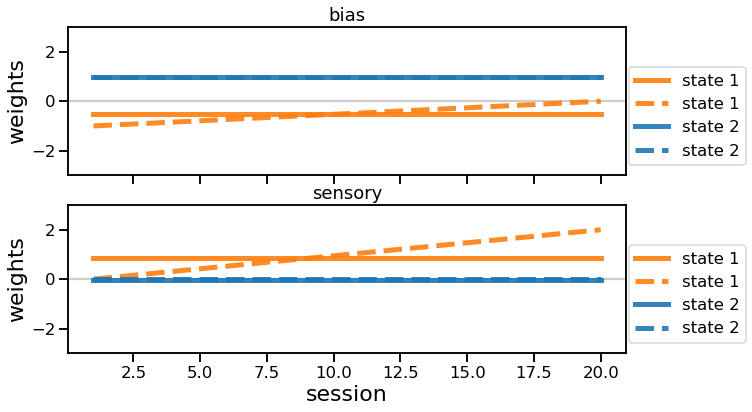

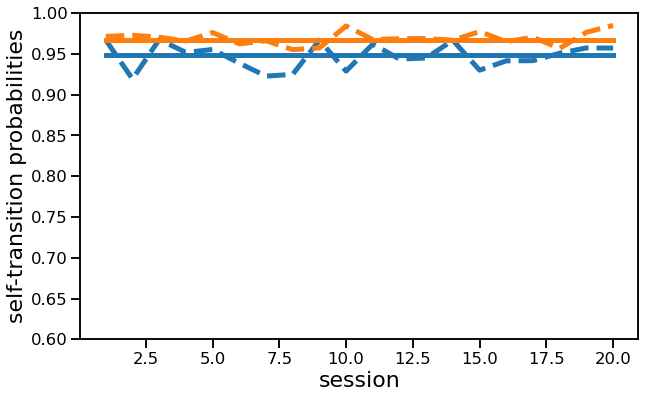

In [41]:
model_type = 'standard'
initP, initpi, initW = dGLMHMM.generate_param(sessInd=sessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)], model_type=model_type) 
present = np.ones((N))
irrelevantSigma = np.ones((K,D))
standardP, standardpi, standardW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=initP, initpi=initpi, initW=initW, sigma=irrelevantSigma, sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=[10,1], model_type=model_type) # fit the model
fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
reorder = [1,0]
plotting_weights_per_feature(standardW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
fig, axes = plt.subplots(figsize=(8,6))
plotting_self_transition_probabilities(standardP, sessInd, axes, sortedStateInd=None, linestyle='-')
plotting_self_transition_probabilities(trueP, sessInd, axes, sortedStateInd=None, linestyle='--')
print(standardP[0])

0
[[0.96807293 0.03192707]
 [0.05096672 0.94903328]]


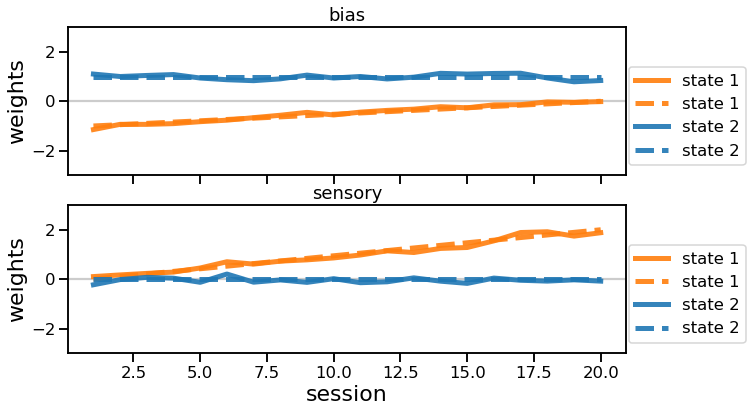

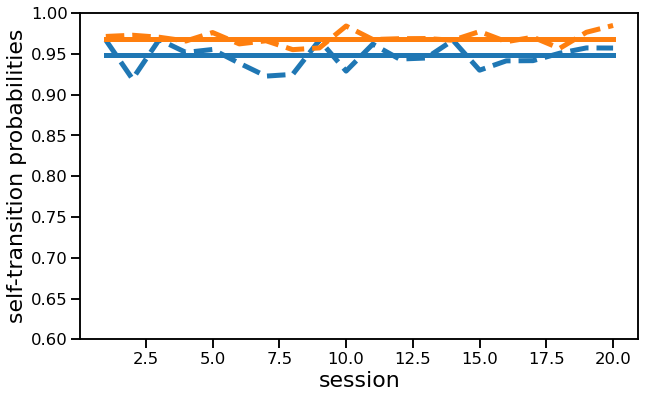

In [42]:
model_type = 'partial'
present = np.ones((N))
sigma = np.ones((K,D)) * 0.2
partialP, partialpi, partialW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=standardP, initpi=standardpi, initW=standardW, sigma=sigma, sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=[10,1], model_type=model_type) # fit the model

fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(partialW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
fig, axes = plt.subplots(figsize=(9,5))
plotting_self_transition_probabilities(partialP, sessInd, axes, sortedStateInd=None, linestyle='-')
plotting_self_transition_probabilities(trueP, sessInd, axes, sortedStateInd=None, linestyle='--')
print(partialP[0])

0
[[0.96807293 0.03192707]
 [0.05096672 0.94903328]]


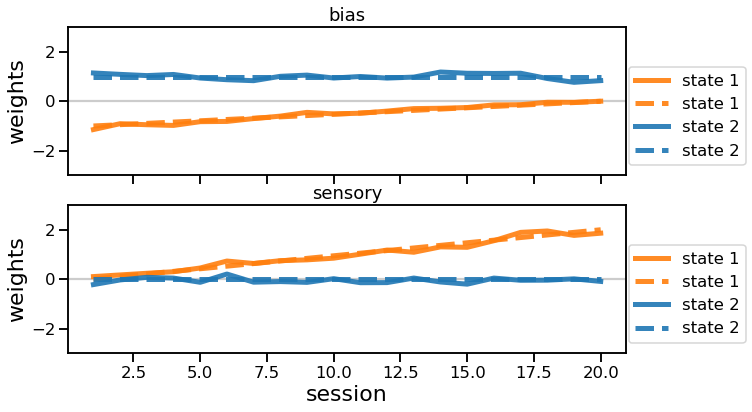

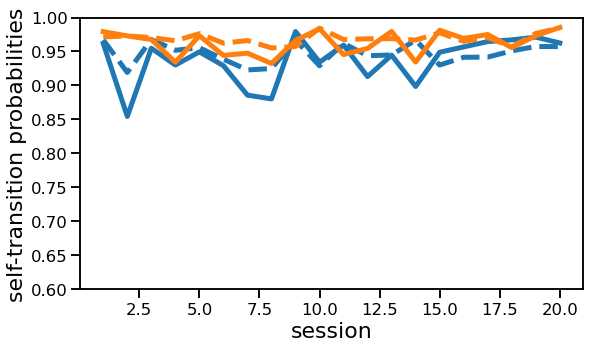

In [43]:
model_type = 'dynamic'
present = np.ones((N))
sigma = np.ones((K,D)) * 0.2
dynamicP, dynamicpi, dynamicW, _ = dGLMHMM.fit(trainX, trainY,  present, initP=partialP, initpi=partialpi, initW=partialW, sigma=sigma, sessInd=sessInd, maxIter=250, tol=1e-4, A=partialP[0], priorDirP=None, model_type=model_type) # fit the model

fig, axes = plt.subplots(2,1, figsize=(10,6), sharex=True)
plotting_weights_per_feature(dynamicW, sessInd=sessInd, axes=axes, yLim=[[-3,3],[-3,3]], trueW=trueW, labels=['bias', 'sensory'])
fig, axes = plt.subplots(figsize=(9,5))
plotting_self_transition_probabilities(dynamicP, sessInd, axes, sortedStateInd=None, linestyle='-')
plotting_self_transition_probabilities(trueP, sessInd, axes, sortedStateInd=None, linestyle='--')
print(partialP[0])

### Checking CV fit

In [36]:
splitFolds = 5
x, y, _ = dGLM_HMM2.simulate_data(trueW, trueP, truepi, sessInd, save=False, title=f'/N={N}_{K}_state_constant-drift_train')
presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)

maxiter = 250
allLl = np.zeros((splitFolds, maxiter))
allP = np.zeros((splitFolds, N, K, K))
allW = np.zeros((splitFolds, N, K, D, C))

fitFolds = 2
for fold in range(0, fitFolds):
    allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=reshapeP_M1_to_M2(checkP1, N), initpi=initpi, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=500, globalP=checkP1, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                            
    # # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=trueP, initpi=initpi, initW=trueW, sigma=reshapeSigma(0.2, K, D), alpha=500, globalP=ourP, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                
    # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=checkP1, initpi=initpi, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=500, globalP=ourP, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
     

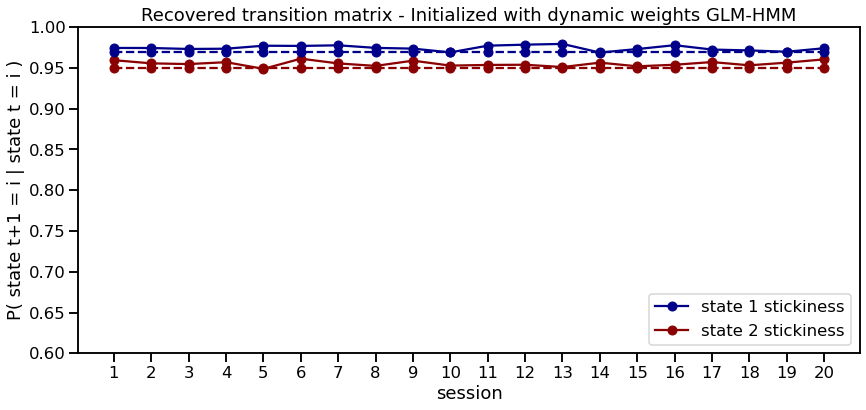

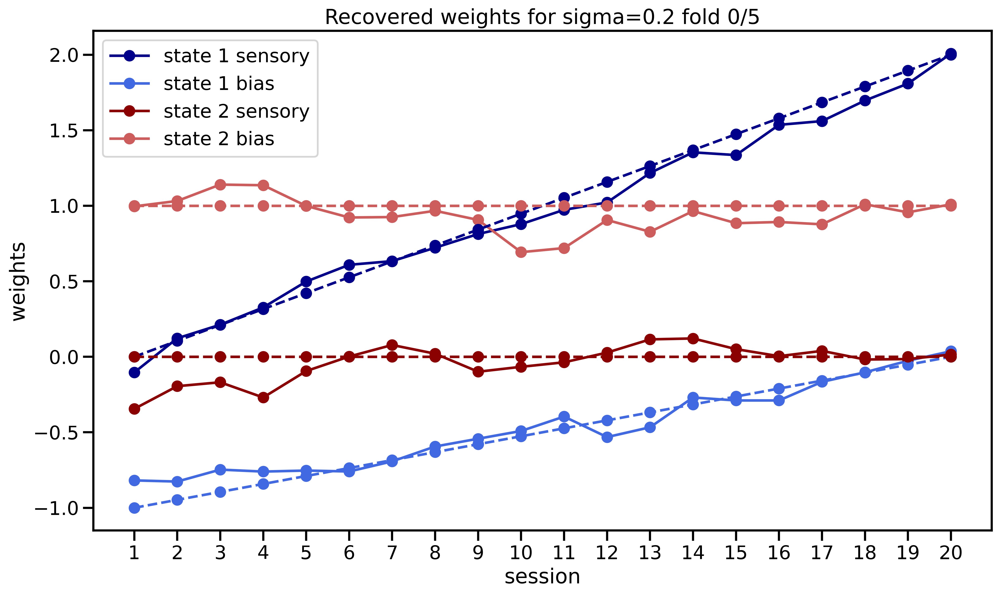

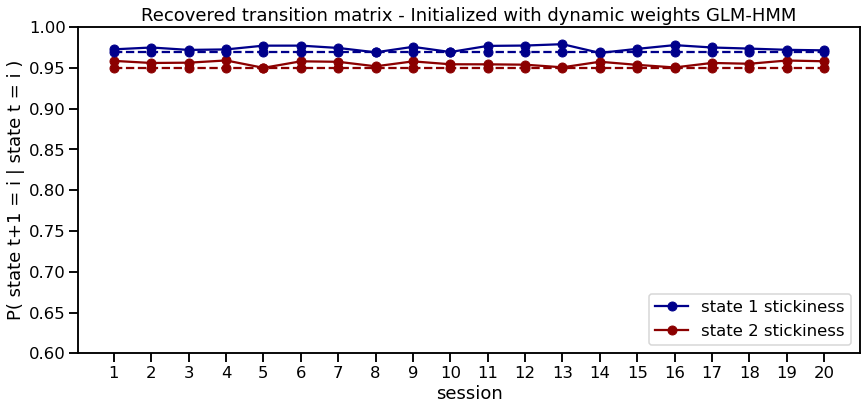

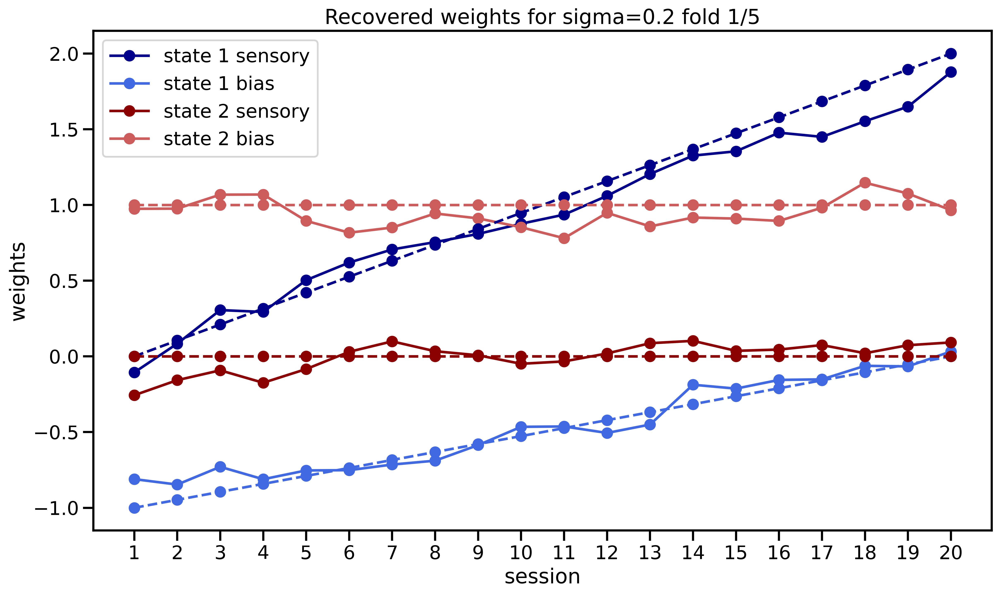

In [37]:
for fold in range(0, fitFolds):
    sortedStateInd = get_states_order(allW[fold], sessInd, stimCol=[1])
    fig, axes = plt.subplots(1, figsize = (14, 6))
    plotting_self_transition_probabilities(allP[fold], sessInd, axes, trueP=trueP, title='Recovered transition matrix - Initialized with dynamic weights GLM-HMM', save_fig=False, sortedStateInd=sortedStateInd)
    fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
    plotting_weights(allW[fold], sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 fold {fold}/{splitFolds}', save_fig=False, sortedStateInd=sortedStateInd)

In [4]:
# # Fitting for different values of alpha
# # alphaList = [4**x for x in list(np.arange(-3,2, dtype=float))] + [4**x for x in list(np.arange(2,5,0.5, dtype=float))] + [4**x for x in list(np.arange(5,9,1, dtype=float))]
# # alphaList = [4**x for x in [-3,-1,1,3,4,5,7,9]]
# alphaList = [4**x for x in list(np.arange(-1,10,1, dtype=float))] # + [4**x for x in list(np.arange(2,4,0.25, dtype=float))] + [4**x for x in list(np.arange(4,7,1, dtype=float))]
# maxiter=600
# allLl = np.zeros((len(alphaList),maxiter))
# allP = np.zeros((len(alphaList),N,K,K))
# allW = np.zeros((len(alphaList),N,K,D,C))
# testLl = np.zeros((len(alphaList)))

# oneSessInd = [0,N] # treating whole dataset as one session for normal GLM-HMM fitting
# initP0, initW0 = dGLMHMM1.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) # initial random param
# initP,  initW, _ = dGLMHMM1.fit(trainX, trainY,  initP0, initW0, sigma=reshapeSigma(1, K, D), sessInd=oneSessInd, pi0=None, maxIter=maxiter, tol=1e-4) # GLM-HMM param # sigma does not matter
# checkP0,  checkW0, _ = dGLMHMM1.fit(trainX, trainY,  initP, initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, pi0=None, maxIter=maxiter, tol=1e-4) # dGLM-HMM1 
# print(checkP0)

# for indAlpha in range(0,len(alphaList)): 
#    print(f'indAlpha {indAlpha}')

#    # fit
#    allP[indAlpha],allW[indAlpha], allLl[indAlpha] = dGLMHMM.fit(trainX, trainY,  initP=reshapeP_M1_to_M2(checkP0, N), initW=checkW0, sigma=reshapeSigma(0.2, K, D), alpha=alphaList[indAlpha], globalP=ourP, sessInd=sessInd, pi0=None, maxIter=maxiter, tol=1e-3) # fit the model
   
#    # evaluate
#    testPhi = dGLMHMM.observation_probability(testX, reshapeWeights(allW[indAlpha], sessInd, testSessInd))
#    for s in range(0, S):
#       _, _, temp = dGLMHMM.forward_pass(testY[testSessInd[s]:testSessInd[s+1]],allP[indAlpha][testSessInd[s]:testSessInd[s+1]],testPhi[testSessInd[s]:testSessInd[s+1]])
#       testLl[indAlpha] += temp
   
# testLl = testLl / testSessInd[-1] # normalizing to the total number of trials in test
    
# np.save(f'../data/Ll_N={N}_{K}_state_constantP_trueGlobal', allLl)
# np.save(f'../data/P_N={N}_{K}_state_constantP_trueGlobal', allP)
# np.save(f'../data/W_N={N}_{K}_state_constantP_trueGlobal', allW)
# np.save(f'../data/testLl_N={N}_{K}_state_constantP_trueGlobal', testLl)



In [14]:
allP = np.load(f'../data/P_N={N}_{K}_state_constantP_consecFitting.npy')
testLl = np.load(f'../data/testLl_N={N}_{K}_state_constantP_consecFitting.npy')
alphaList = [4**x for x in list(np.arange(0.5,5,0.5, dtype=float))]
print(allP.shape)

(9, 50000, 2, 2)
9


Text(0.5, 1.0, 'Model performance as a function of hyperparameter alpha - constant P')

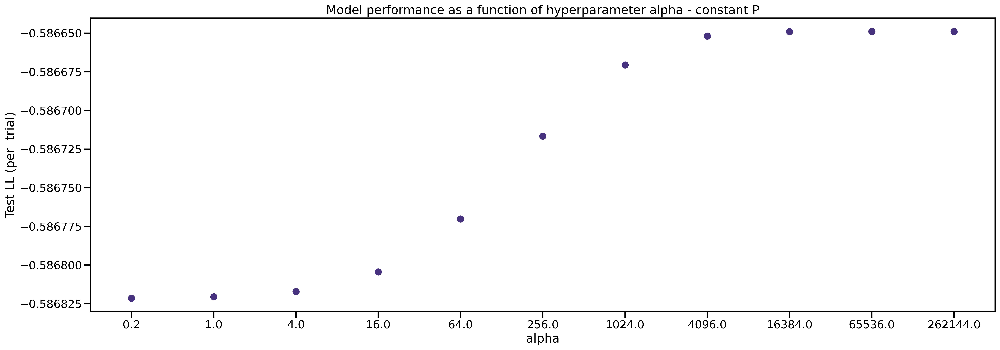

In [10]:
fig, axes = plt.subplots(1, figsize = (24,8), dpi=400)
colormap = sns.color_palette("viridis")
axes.scatter(np.log2(alphaList), testLl[:], color = colormap[0])
axes.set_xlabel('alpha')
axes.set_ylabel('Test LL (per  trial)')
# alphaListEven = [alphaList[ind] for ind in range(0,len(alphaList),2)]
# axes.set_xticks(np.log2(alphaListEven),[f'{np.round(alpha,1)}' for alpha in alphaListEven])
axes.set_xticks(np.log2(alphaList),[f'{np.round(alpha,1)}' for alpha in alphaList])
axes.set_title('Model performance as a function of hyperparameter alpha - constant P')
#fig.savefig(f'../figures/Alpha_vs_TestLl-version1.png', bbox_inches='tight', dpi=400)

### Checking whole dataset fit

In [38]:
# dGLM-HMM1 fitting
oneSessInd=[0,N]
present = np.ones((N)).astype(int) # using all data
initP0, initpi0, initW0 = dGLM_HMM1.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
initP, initpi, initW, _ = dGLM_HMM1.fit(x, y, present, initP0, initpi0, initW0, sigma=reshapeSigma(0, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # sigma does not matter here
checkP1, checkpi1, checkW1, _ = dGLM_HMM1.fit(x, y, present, initP=initP, initpi=initpi, initW=initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
sortedStateInd = get_states_order(checkW1, sessInd, stimCol=[1])

# dGLM-HMM2 fitting
checkP, checkpi, checkW, _ = dGLM_HMM2.fit(x, y, present, initP=reshapeP_M1_to_M2(checkP1, N), initpi=checkpi1, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=200, globalP=checkP1, sessInd=sessInd, maxIter=250, tol=1e-3, L2penaltyW=1, fit_init_states=False)

# # checking when initializing from true param
# checkP, checkpi, checkW, _ = dGLM_HMM2.fit(x, y, present, initP=trueP, initpi=truepi, initW=trueW, sigma=reshapeSigma(0.2, K, D), alpha=2000, globalP=ourP, sessInd=sessInd, maxIter=250, tol=1e-3, L2penaltyW=1, fit_init_states=False)

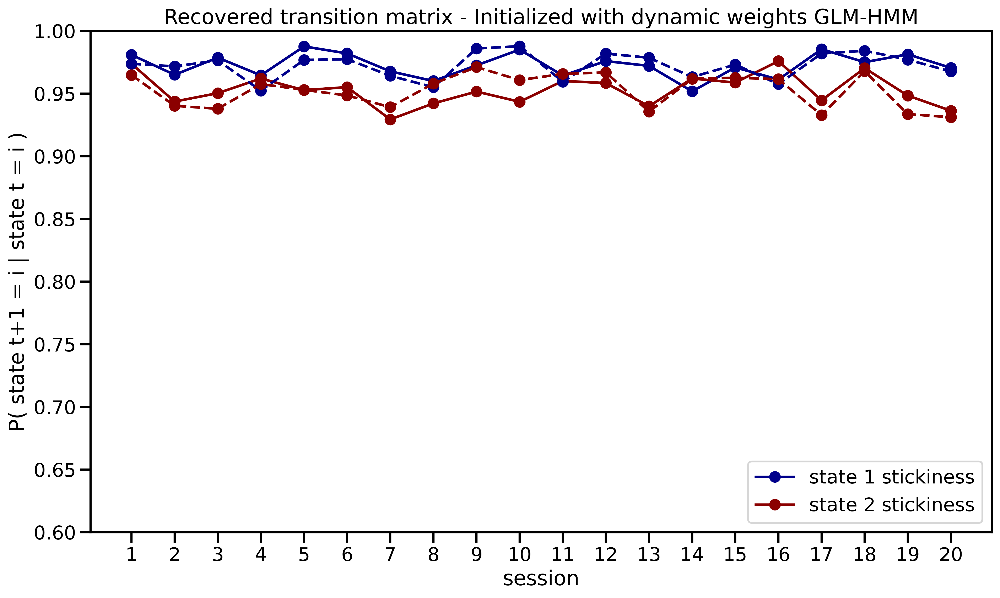

In [39]:
fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
plotting_self_transition_probabilities(checkP, sessInd, axes, trueP=trueP, title='Recovered transition matrix - Initialized with dynamic weights GLM-HMM', save_fig=False, sortedStateInd=sortedStateInd)

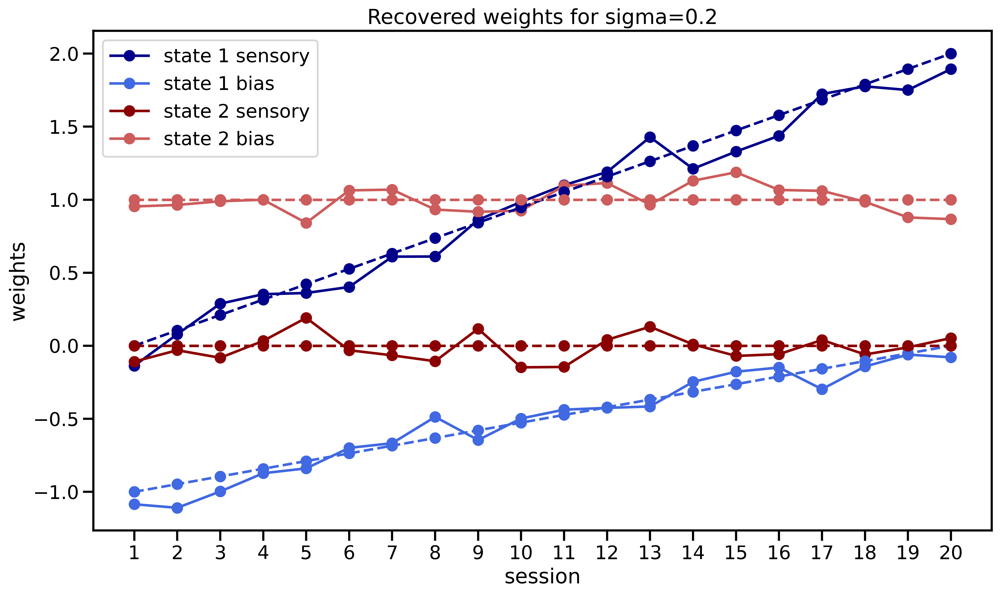

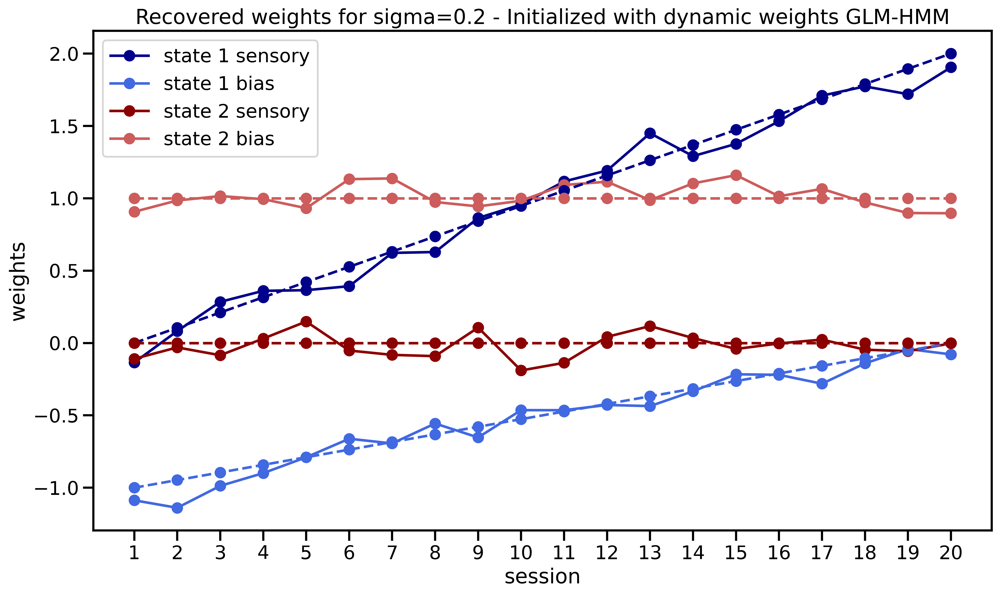

In [41]:
fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
plotting_weights(checkW1, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2', save_fig=False, sortedStateInd=sortedStateInd)
fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
plotting_weights(checkW, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 - Initialized with dynamic weights GLM-HMM', save_fig=False, sortedStateInd=sortedStateInd)

In [15]:
splitFolds = 5
x, y, _ = dGLM_HMM2.simulate_data(trueW, trueP, truepi, sessInd, save=False, title=f'/N={N}_{K}_state_constant-drift_train')
presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)

maxiter = 250
allLl = np.zeros((splitFolds, maxiter))
allP = np.zeros((splitFolds, N, K, K))
allW = np.zeros((splitFolds, N, K, D, C))

# dGLM-HMM1 fitting
oneSessInd=[0,N]
present = np.ones((N)).astype(int) # using all data
initP0, initpi0, initW0 = dGLM_HMM1.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
initP, initpi, initW, _ = dGLM_HMM1.fit(x, y, present, initP0, initpi0, initW0, sigma=reshapeSigma(0, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # sigma does not matter here
checkP1, checkpi1, checkW1, _ = dGLM_HMM1.fit(x, y, present, initP=initP, initpi=initpi, initW=initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
sortedStateInd = get_states_order(checkW1, sessInd, stimCol=[1])
print(checkP1)

fitFolds = 3
for fold in range(0, fitFolds):
    allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=reshapeP_M1_to_M2(checkP1, N), initpi=initpi, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=alpha, globalP=checkP1, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                            
    # # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=trueP, initpi=initpi, initW=trueW, sigma=reshapeSigma(0.2, K, D), alpha=500, globalP=ourP, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                
    # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=checkP1, initpi=initpi, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=500, globalP=ourP, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
   

[[0.97525109 0.02474891]
 [0.04200569 0.95799431]]


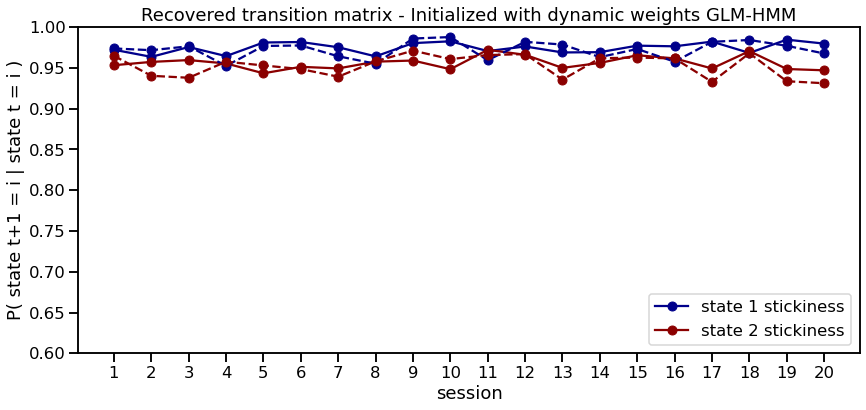

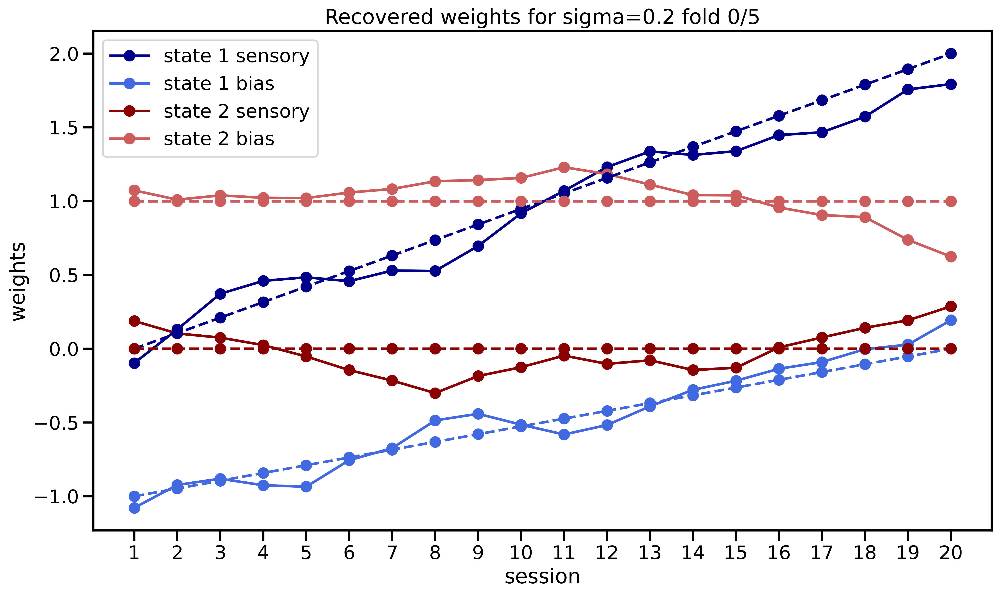

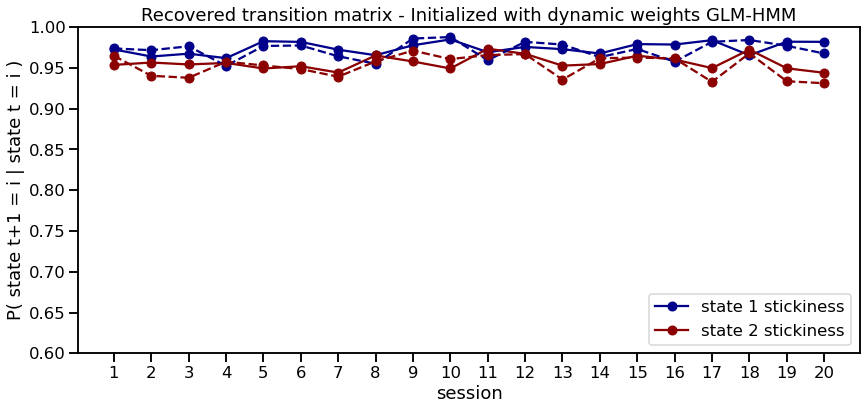

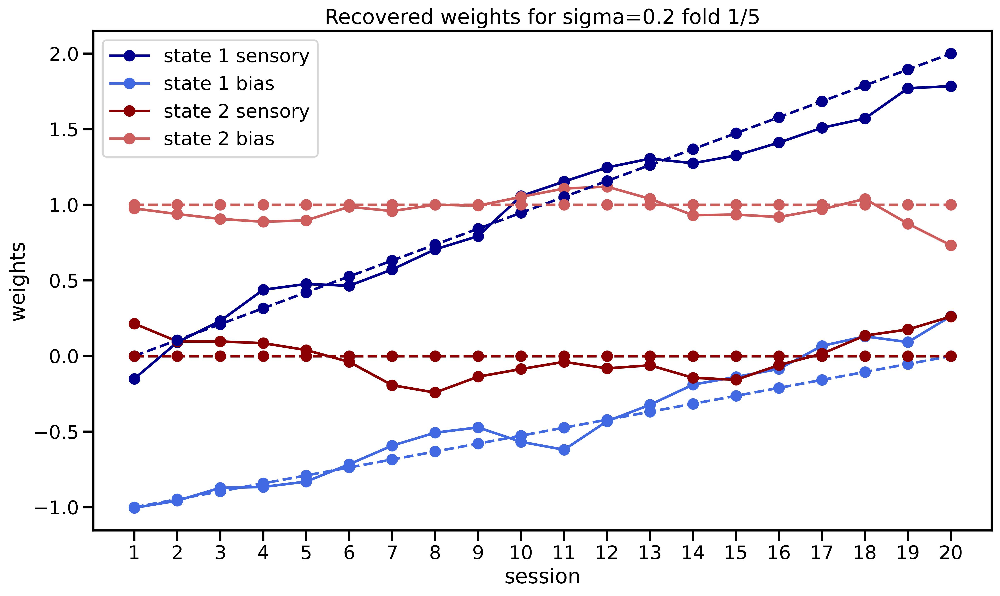

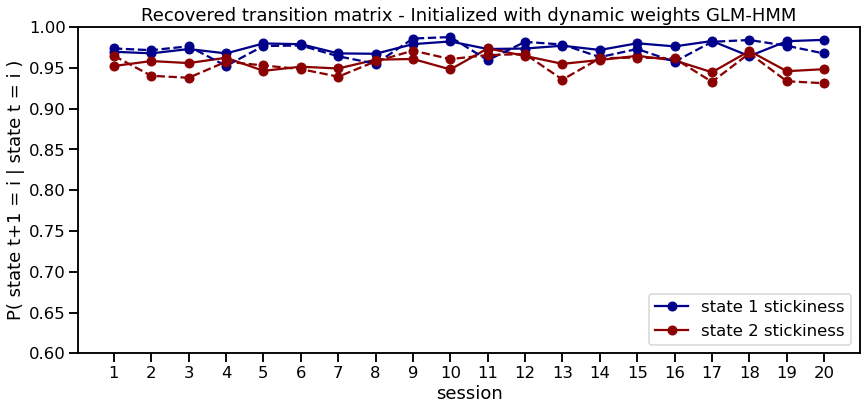

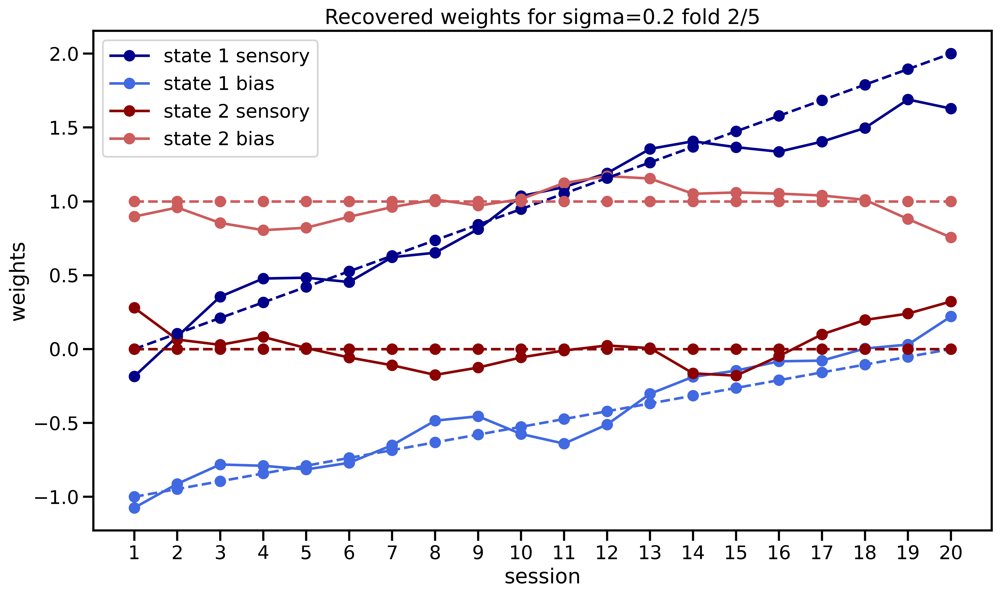

In [16]:
for fold in range(0, fitFolds):
    sortedStateInd = get_states_order(allW[fold], sessInd, stimCol=[1])
    fig, axes = plt.subplots(1, figsize = (14, 6))
    plotting_self_transition_probabilities(allP[fold], sessInd, axes, trueP=trueP, title='Recovered transition matrix - Initialized with dynamic weights GLM-HMM', save_fig=False, sortedStateInd=sortedStateInd)
    fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
    plotting_weights(allW[fold], sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 fold {fold}/{splitFolds}', save_fig=False, sortedStateInd=sortedStateInd)

Text(0.5, 1.0, 'Model performance as a function of hyperparameter alpha - true P (Dir alpha=200) and true Global')

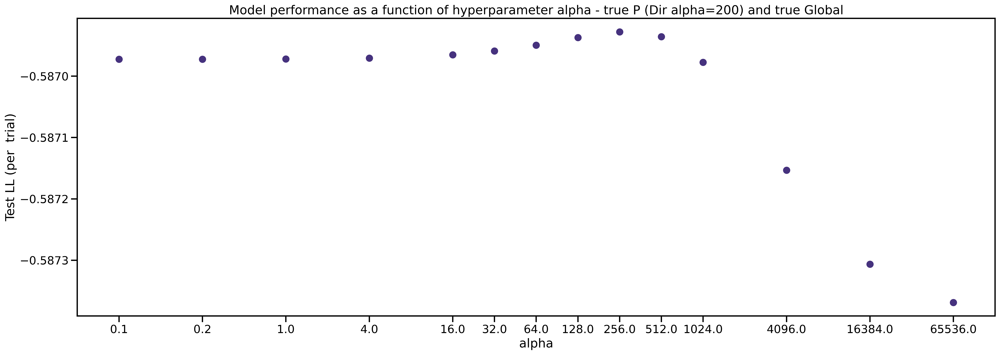

In [35]:
fig, axes = plt.subplots(1, figsize = (24,8), dpi=400)
colormap = sns.color_palette("viridis")
axes.scatter(np.log2(alphaList), testLl[:], color = colormap[0])
axes.set_xlabel('alpha')
axes.set_ylabel('Test LL (per  trial)')
# alphaListEven = [alphaList[ind] for ind in range(0,len(alphaList),2)]
# axes.set_xticks(np.log2(alphaListEven),[f'{np.round(alpha,1)}' for alpha in alphaListEven])
axes.set_xticks(np.log2(alphaList),[f'{np.round(alpha,1)}' for alpha in alphaList])
axes.set_title('Model performance as a function of hyperparameter alpha - true P (Dir alpha=200) and true Global')
#fig.savefig(f'../figures/Alpha_vs_TestLl-version1.png', bbox_inches='tight', dpi=400)

### Linearly changing true transition matrix P

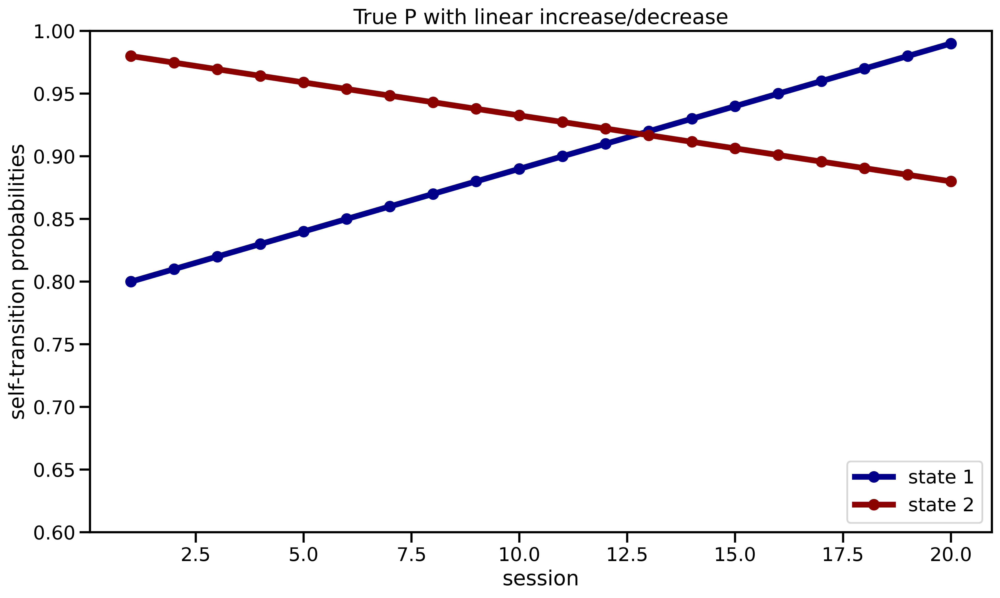

In [5]:
ourP = np.zeros((S,K,K))
ourP[:,0,0] = np.linspace(0.8,0.99,S) # state 1 sensory (increasing)
ourP[:,1,1] = np.linspace(0.98,0.88,S) # state 1 bias (decreasing)
ourP[:,0,1] = 1 - ourP[:,0,0]
ourP[:,1,0] = 1 - ourP[:,1,1]

trueP = np.zeros((N,K,K))
for sess in range(0,S):
    for t in range(0,T):
        trueP[sess*T+t] = ourP[sess]

fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
plotting_self_transition_probabilities(trueP, sessInd, axes, trueP=None, title=f'True P with linear increase/decrease', save_fig=False)


In [6]:
dGLM_HMM1 = dglm_hmm1.dGLM_HMM1(N,K,D,C)
dGLM_HMM2 = dglm_hmm2.dGLM_HMM2(N,K,D,C)
# x, y, _ = dGLM_HMM2.simulate_data(trueW, trueP, truepi, sessInd, save=True, title=f'N={N}_{K}-state_LinearP_')
x = np.load(f'../data_M2/N={N}_{K}-state_LinearP_x.npy')
y = np.load(f'../data_M2/N={N}_{K}-state_LinearP_y.npy')

### CV fitting

In [7]:
splitFolds = 5
presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)

maxiter = 250
allLl = np.zeros((splitFolds, maxiter))
allP = np.zeros((splitFolds, N, K, K))
allW = np.zeros((splitFolds, N, K, D, C))

# dGLM-HMM1 fitting
oneSessInd=[0,N]
present = np.ones((N)).astype(int) # using all data
initP0, initpi0, initW0 = dGLM_HMM1.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
initP, initpi, initW, _ = dGLM_HMM1.fit(x, y, present, initP0, initpi0, initW0, sigma=reshapeSigma(0, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # sigma does not matter here
checkP1, checkpi1, checkW1, _ = dGLM_HMM1.fit(x, y, present, initP=initP, initpi=initpi, initW=initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
sortedStateInd = get_states_order(checkW1, sessInd, stimCol=[1])
print(checkP1)

fitFolds = 2
for fold in range(0, fitFolds):
    print("Fold ",fold)
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=reshapeP_M1_to_M2(checkP1, N), initpi=initpi, initW=checkW1, sigma=reshapeSigma(0.2, K, D), alpha=0, globalP=checkP1, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                            
    # # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=trueP, initpi=truepi, initW=trueW, sigma=reshapeSigma(0.2, K, D), alpha=0, globalP=initP0, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
                                
    #WORKS!
    allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM2.fit(x, y, presentTrain[fold], initP=trueP, initpi=truepi, initW=trueW, sigma=reshapeSigma(0.2, K, D), alpha=0, globalP=checkP1, sessInd=sessInd, maxIter=maxiter, tol=1e-4, L2penaltyW=1, fit_init_states=False) # fit the model
   

[[0.91639668 0.08360332]
 [0.05496903 0.94503097]]
Fold  0
Fold  1


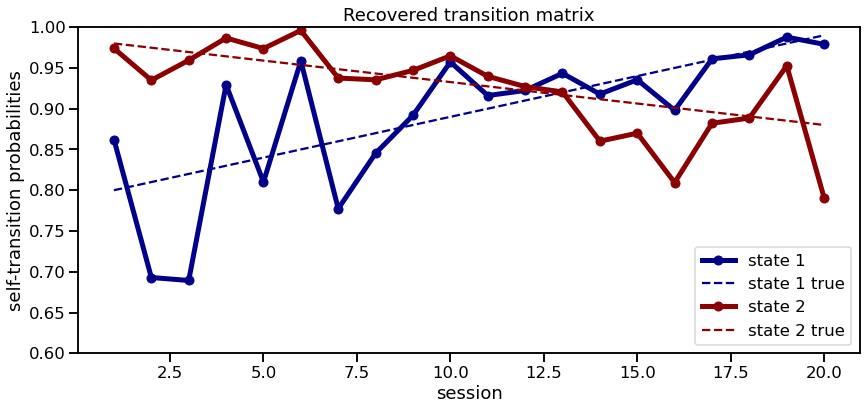

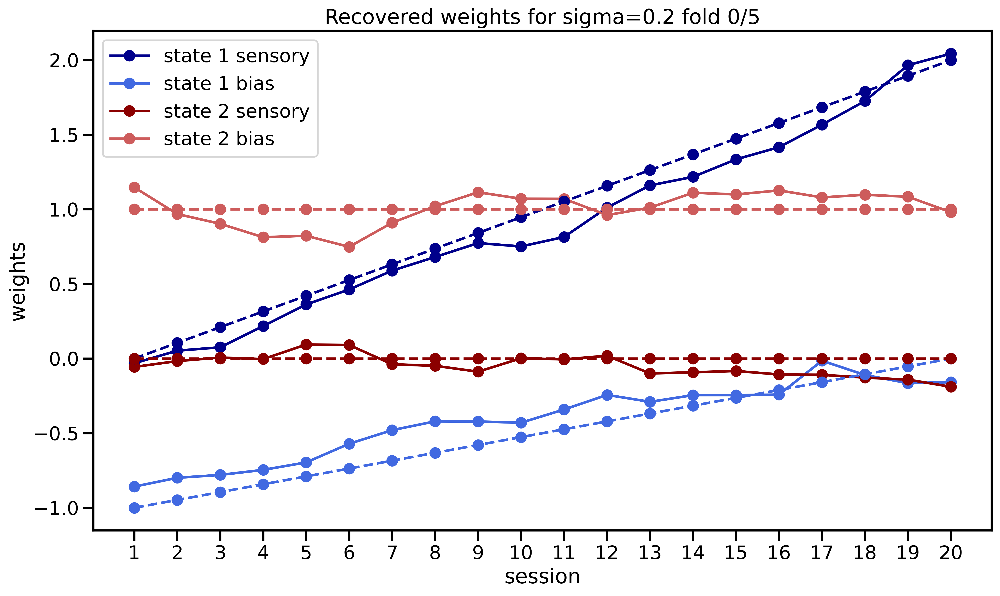

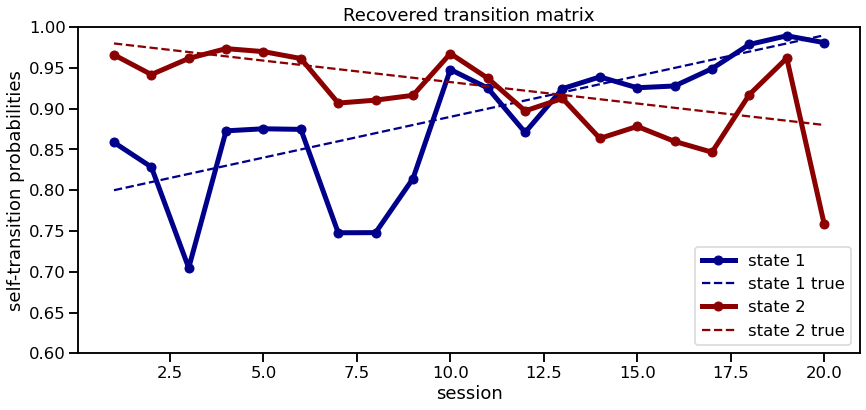

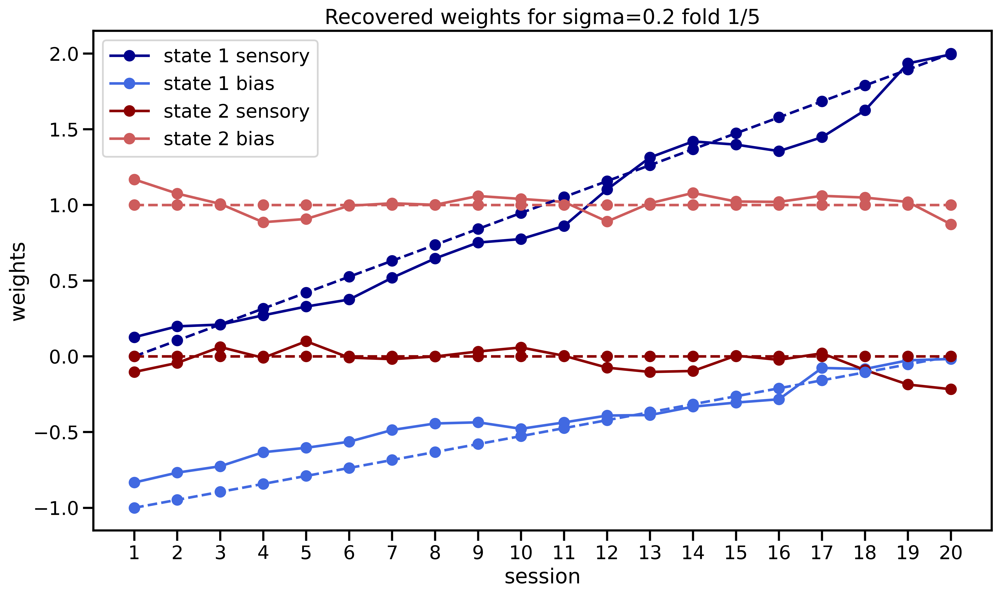

In [19]:
for fold in range(0, fitFolds):
    fig, axes = plt.subplots(1, figsize = (14, 6))
    plotting_self_transition_probabilities(allP[fold], sessInd, axes, trueP=trueP, title='Recovered transition matrix', save_fig=False, sortedStateInd=[0,1])
    fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
    plotting_weights(allW[fold], sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 fold {fold}/{splitFolds}', save_fig=False, sortedStateInd=[0,1])

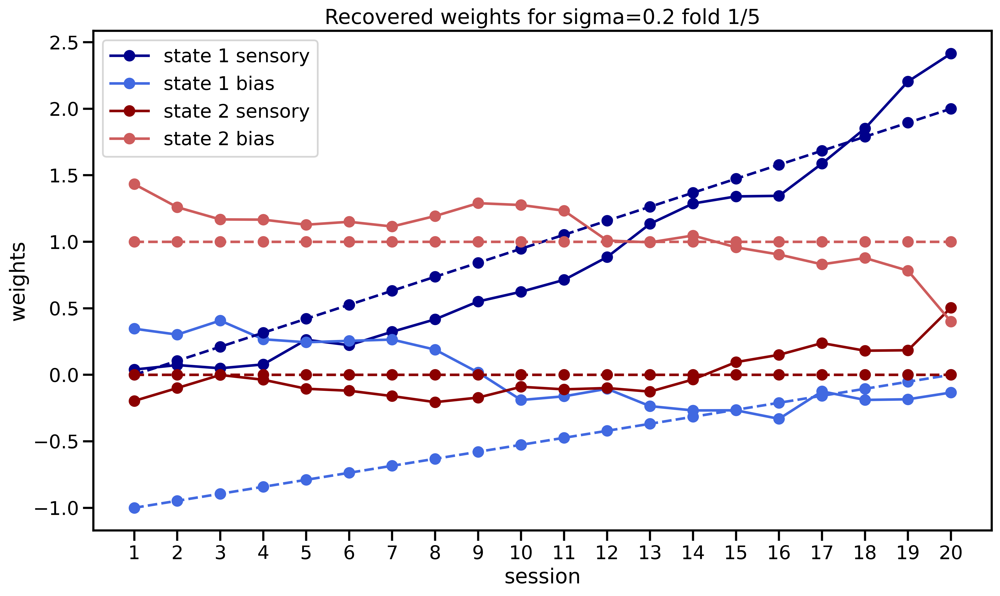

In [13]:
fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
sortedStateInd = get_states_order(checkW1, sessInd, stimCol=[1])
plotting_weights(checkW1, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 fold {fold}/{splitFolds}', save_fig=False, sortedStateInd=sortedStateInd)

In [9]:
fold = 0
alphaList = [(5**x) for x in list(np.arange(-2,5,1,dtype=float))] 
P, pi, W, trainLl, testLl, testAccuracy = fit_eval_CV_multiple_alphas(K, x, y, sessInd, presentTrain[fold], presentTest[fold], alphaList=alphaList, maxiter=maxiter, dglmhmmW=checkW1, globalP=checkP1, bestSigma=0.2, L2penaltyW=1, fit_init_states=False)

   

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


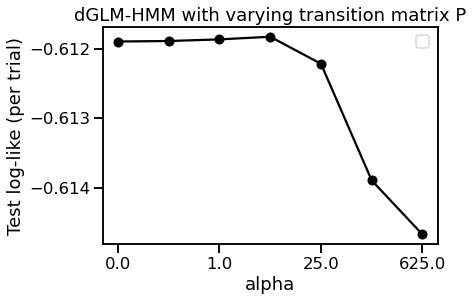

In [12]:
fig, axes = plt.subplots()
plot_testLl_CV_alpha(testLl, alphaList, axes=axes, label='',color='black')

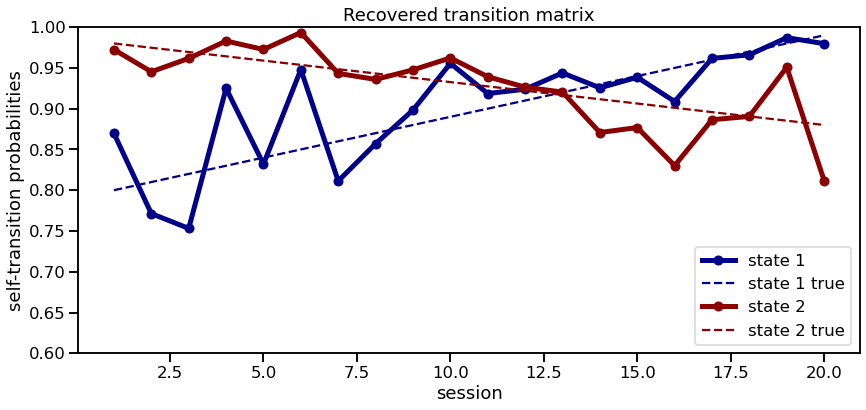

In [25]:
fig, axes = plt.subplots(1, figsize = (14, 6))
plotting_self_transition_probabilities(P[3], sessInd, axes, trueP=trueP, title='Recovered transition matrix', save_fig=False, sortedStateInd=[1,0])
    